# Random Foreset Classifier Explained

The Random Forest Classifier
Random forest, like its name implies, consists of a large number of individual decision trees that operate as an ensemble. Each individual tree in the random forest spits out a class prediction and the class with the most votes becomes our model’s prediction.

The fundamental concept behind random forest is a simple but powerful one — the wisdom of crowds. In data science speak, the reason that the random forest model works so well is:
A large number of relatively uncorrelated models (trees) operating as a committee will outperform any of the individual constituent models.

The low correlation between models is the key. Just like how investments with low correlations (like stocks and bonds) come together to form a portfolio that is greater than the sum of its parts, uncorrelated models can produce ensemble predictions that are more accurate than any of the individual predictions. 

The reason for this wonderful effect is that the trees protect each other from their individual errors (as long as they don’t constantly all err in the same direction). While some trees may be wrong, many other trees will be right, so as a group the trees are able to move in the correct direction. So the prerequisites for random forest to perform well are:

- There needs to be some actual signal in our features so that models built using those features do better than random guessing.
- The predictions (and therefore the errors) made by the individual trees need to have low correlations with each other.

What do we need in order for our random forest to make accurate class predictions?

- We need features that have at least some predictive power. After all, if we put garbage in then we will get garbage out.

- The trees of the forest and more importantly their predictions need to be uncorrelated (or at least have low correlations with each other). While the algorithm itself via feature randomness tries to engineer these low correlations for us, the features we select and the hyper-parameters we choose will impact the ultimate correlations as well.

In [3]:
from sklearn.ensemble import RandomForestClassifier

import numpy as np
from sklearn.datasets import make_blobs
import os, sys, plotly.graph_objects as go
module_path = os.path.abspath(os.path.join('../../../../..'))
if module_path not in sys.path:
    sys.path.append(module_path) 
from erudition.learning.helpers.plots.plotly_render import render, scatter

In [4]:
X, y = make_blobs(n_samples=200, centers=3, random_state=0, cluster_std=0.8)

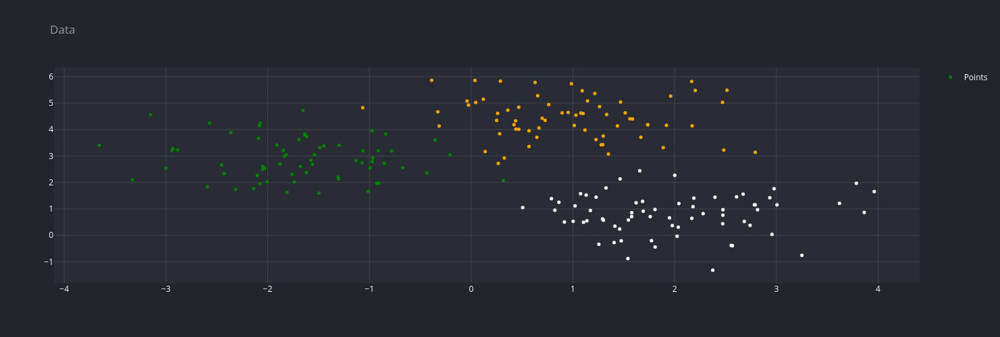

In [8]:
fig = go.Figure(
    data=[
        scatter(X[:,0],X[:,1], 'Points', mode='markers', color = [['orange', 'white', 'green'][a] for a in y], size=5, opacity=1)
    ]
)
render(fig, title='Data')

In [6]:
model = RandomForestClassifier()
model.fit(X,y)

/home/jez/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

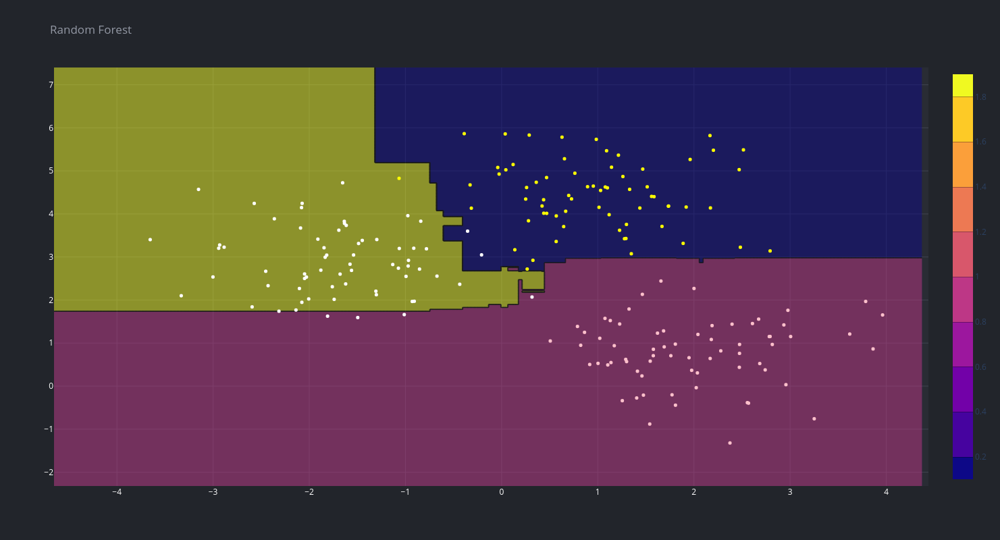

In [15]:
# create a mesh to plot in
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
h = (x_max / x_min)/100
xx, yy = np.meshgrid(np.arange(x_min, x_max, -h),np.arange(y_min, y_max, -h))


Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

fig = go.Figure(data=[
    scatter(X[:, 0], X[:, 1], '', mode='markers', size=5, opacity=1, color = [['yellow', 'pink', 'white'][a] for a in y]),
    go.Contour(
        z=Z,
        x=np.linspace(x_min, x_max-1, Z.shape[0]),
        y=np.linspace(y_min, y_max+1, Z.shape[1]),
        #contours_coloring='lines',
        opacity=0.5,
        #line_width=4,
    )
    ])
render(fig, title='Random Forest', height=800, width=800)